In [1]:
%matplotlib inline
!pip install geopandas
!pip install contextily
!pip install matplotlib_scalebar
!pip install osmnx
!pip install pygeos
!pip install rtree
import geopandas as gpd
import pandas as pd
import os
import json
import glob
from PIL import Image
import numpy as np
import tqdm
import matplotlib.pyplot as plt
import sys
import shutil
import scipy.stats as stats
import seaborn as sns
import contextily as ctx
from shapely.geometry import Point
from matplotlib_scalebar.scalebar import ScaleBar
from geopandas.tools import sjoin
from IPython.display import display, Image
from scipy.stats import ttest_ind

     |████████████████████████████████| 112 kB 19.3 MB/s eta 0:00:01
     |████████████████████████████████| 2.1 MB 20.4 MB/s eta 0:00:01


/home/ec2-user/anaconda3/envs/mxnet_latest_p37/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


# Study area

# street network

In [ ]:
city_list=['Singapore',
           'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"

# go through city_list
for city in city_list:
    edges=os.path.join(root,'data/network/{}_street_network/edges.shp'.format(city))
    edges_gdf=gpd.read_file(edges)
    print(edges_gdf)

# Segmentation
## convert grayscale to RGB

In [ ]:
city_list=[
    'Singapore',
    'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"
config=os.path.join(root,'models/config_v1.2.json')

# load json file for conversion
with open(config) as json_file: 
    config_dict = json.load(json_file) 
# clean config to create color map
config_dict_clean=[config_dict['labels'][i]['color'] for i in range(len(config_dict['labels']))]
color_map = np.array(config_dict_clean,dtype=np.uint8)

# go through city_list
for city in city_list:
    # create a new folder for RGB images
    output_folder=os.path.join(root,'output/segmentation_rgb/{}/'.format(city))
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # go through each grayscale image
    img_list=glob.glob(os.path.join(root,'output/segmentation/{}/*.png'.format(city)))
    
    for img in tqdm.tqdm(img_list):
        # load the image
        image = Image.open(img)
        # convert image to numpy array
        img_gray = np.asarray(image,dtype=np.uint8)
        
        # convert to rgb
        img_rgb = color_map[img_gray]
        # save as image
        im = Image.fromarray(img_rgb)
        im.save(os.path.join(output_folder,os.path.split(img)[1]))

# overlay RGB to the original image

In [ ]:
city_list=[
    'Singapore',
    'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"


# go through city_list
for city in city_list:
    # create output_folder
    output_folder=os.path.join(root,'output/segmentation_overlaid/{}'.format(city))
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
        
    original_img_list=glob.glob(os.path.join(root,'data/img_stitched_{}/*.jpg'.format(city)))
    segmented_rgb_img_list=glob.glob(os.path.join(root,'output/segmentation_rgb/{}/*.png'.format(city)))
    for original_img in tqdm.tqdm(original_img_list):
        pano_id=os.path.split(original_img)[1].replace('.jpg','')
        segmented_rgb_img=os.path.join(root,'output/segmentation_rgb/{}/{}.png'.format(city,pano_id))
        
        # blend two images
        bg = Image.open(original_img)
        fg = Image.open(segmented_rgb_img)
        fg=fg.convert('RGB')
        # set alpha to .5
        Image.blend(bg, fg, .5).save(os.path.join(output_folder,os.path.split(segmented_rgb_img)[1]))

# survey result

In [ ]:
# load data
root = "/home/ec2-user/SageMaker/"
result=pd.read_csv(os.path.join(root,'data/survey_result/survey_1st_2nd_combined_without_outliers_grouped.csv'))
result.drop(['Unnamed: 0'],axis=1,inplace=True)
result.info()
result.describe()

## correlation matrix

In [ ]:
# correlation matrix
corrMatrix = result[1:].corr() 
sns.heatmap(corrMatrix, annot=True)
plt.savefig(os.path.join(root, 'output/survey_result/survey_corr_matrix.jpg'),bbox_inches = "tight",dpi=400)
plt.show()

## scatter plot

In [ ]:
# scatter plot
sns.pairplot(result,plot_kws={'alpha':0.3})
plt.savefig(os.path.join(root, 'output/survey_result/survey_scatter_plot_matrix.jpg'),bbox_inches = "tight",dpi=400)
plt.show()

## Violin plot

In [ ]:
# wide to long
result_long=pd.melt(result, id_vars=['pano_id'], value_vars=result.columns[1:])

plt.figure(figsize=(10, 10))
sns.violinplot(x='variable', y='value', data=result_long)
plt.xticks(rotation=45)
plt.savefig(os.path.join(root, 'output/survey_result/survey_violin_plot.jpg'),bbox_inches = "tight",dpi=400)

## Compare Singapore vs Tokyo

In [ ]:
# load meta data of Singapore and Tokyo and convert panoId into a list
# Singapore
Singapore=os.path.join(root,'data/meta_data_Singapore/Singapore_remaining_points.csv')
Singapore_df=pd.read_csv(Singapore)
Singapore_df['panoId']='pano='+Singapore_df['panoId']
Singapore_list=Singapore_df['panoId'].tolist()
# Tokyo
Tokyo=os.path.join(root,'data/meta_data_Tokyo/Tokyo_remaining_points.csv')
Tokyo_df=pd.read_csv(Tokyo)
Tokyo_df['panoId']='pano='+Tokyo_df['panoId']
Tokyo_list=Tokyo_df['panoId'].tolist()

# create a new column in result_modified to see if the panoId is in which list
cond_list=[result_long['pano_id'].isin(Singapore_list),
          result_long['pano_id'].isin(Tokyo_list)
          ]
choice_list=['Singapore','Tokyo']
result_long['city']=np.select(cond_list,choice_list)
print(result_long)

In [ ]:
plt.figure(figsize=(10, 10))
sns.violinplot(x='variable', y='value',hue="city", data=result_long, split=True, palette='pastel')
plt.xticks(rotation=45)
plt.savefig(os.path.join(root, 'output/survey_result/survey_violin_plot_by_city.jpg'),bbox_inches = "tight",dpi=400)

In [ ]:
result_long.groupby(["variable","city"]).mean()

# Category map
## Point map
### SVI&non-SVI

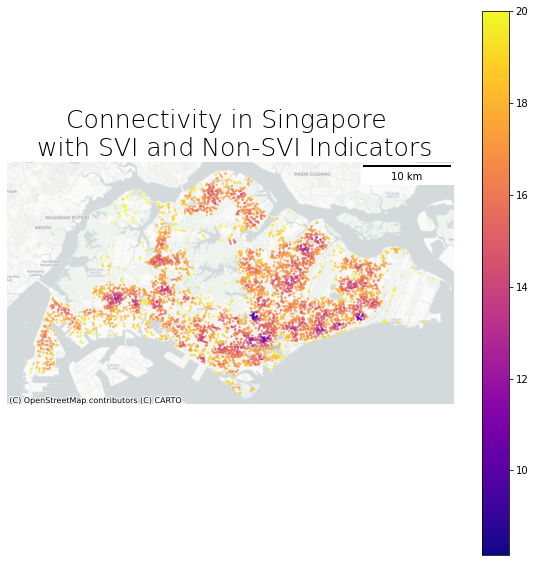

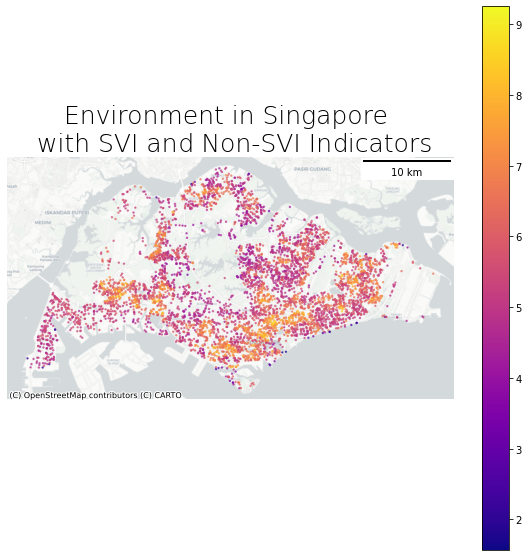

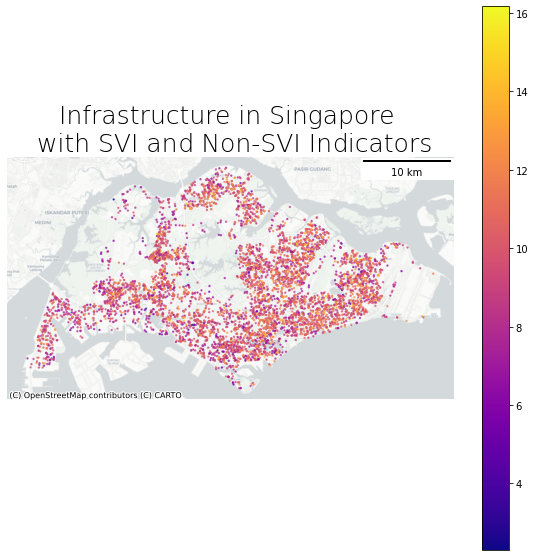

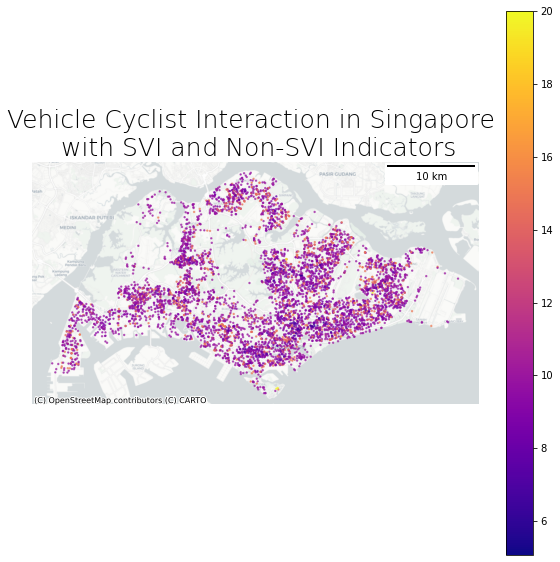

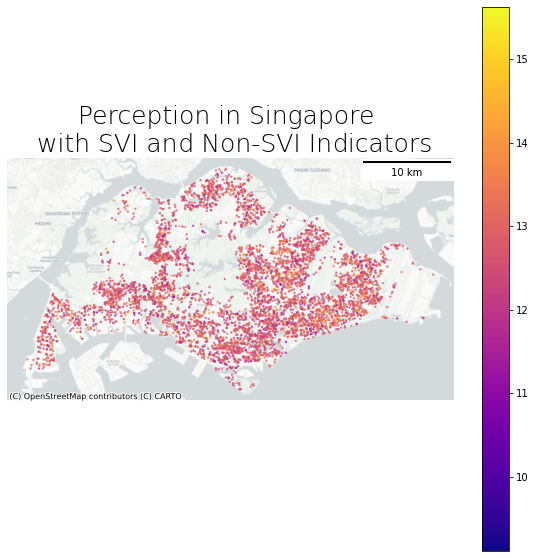

...

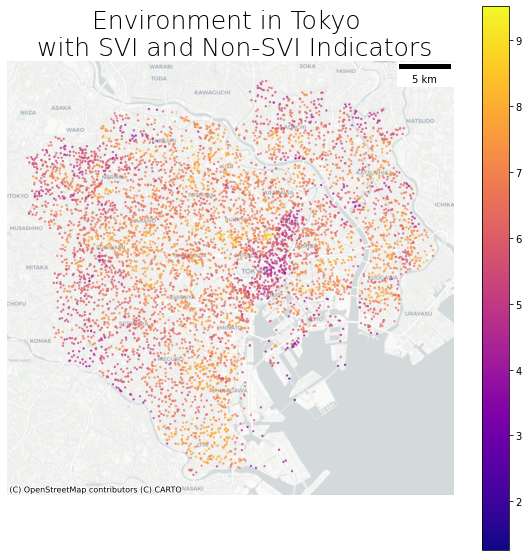

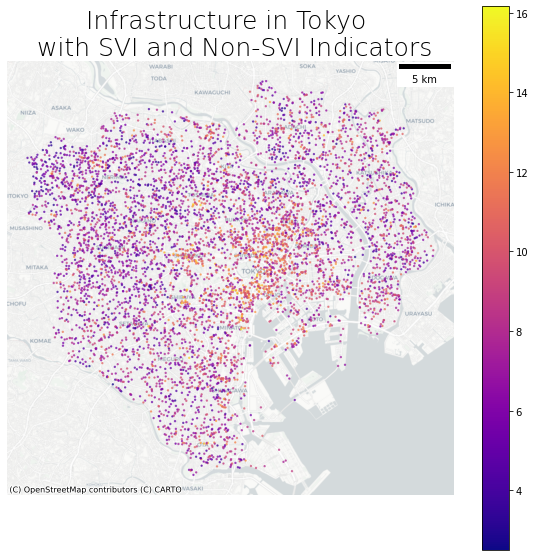

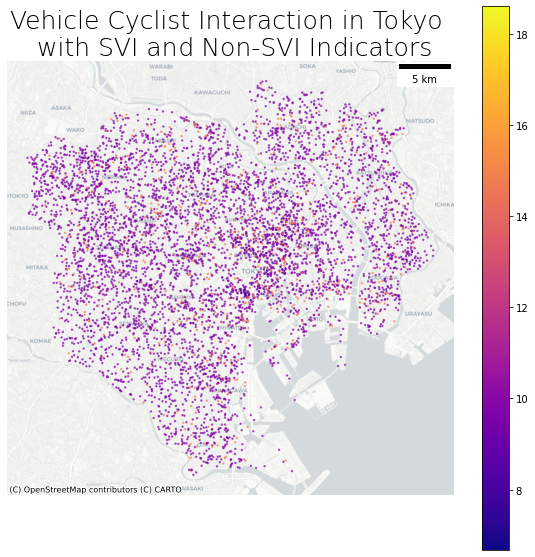

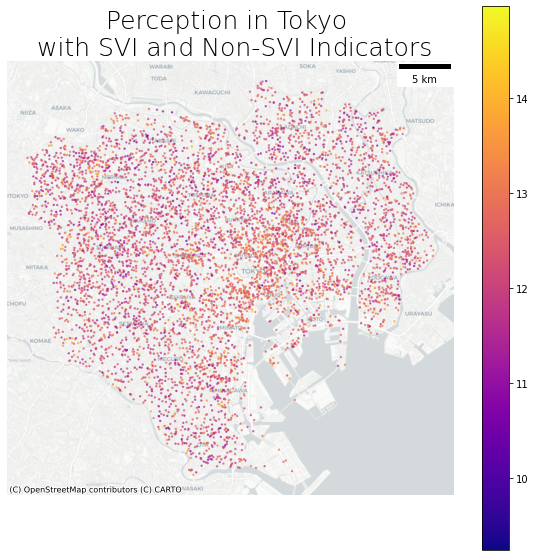

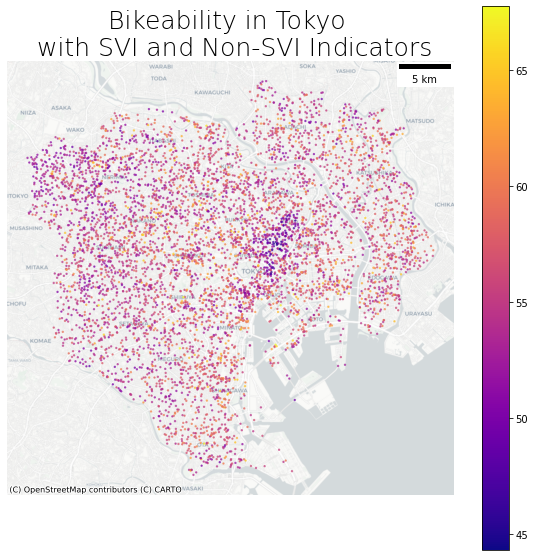

In [9]:
category_list=['connectivity',
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'perception',
               'bikeability'
              ]

city_list=['Singapore',
           'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"

for city in city_list:
    for category in category_list:
        category_df=pd.read_csv(os.path.join(root,'data/tabular_data/{}/{}.csv'.format(city,category)))
        category_df['geometry']=category_df.apply(lambda x: Point((float(x.panoLon), float(x.panoLat))), axis=1)
        category_gdf=gpd.GeoDataFrame(category_df, geometry='geometry')
        category_gdf=category_gdf.set_crs(epsg=4326)
        category_gdf=category_gdf.to_crs("EPSG:3857")
        
        # visualize
        fig, ax = plt.subplots(1, figsize=(10,10))
        category_gdf.plot(column=category,ax=ax,
                          cmap='plasma',
                          alpha=0.6,
                          markersize=2,
                          legend=True
                         )
        ax.set_axis_off()
        # add title
        title="{} in {} \n with SVI and Non-SVI Indicators".format(category.replace('_',' ').title(),city)
        ax.set_title(title, fontdict={"fontsize": "25", "fontweight" : "3"})
        # add scalebar
        scalebar = ScaleBar(dx=1) 
        plt.gca().add_artist(scalebar)
        # add data source
#         if category=='connectivity':
#             data_source='OpenStreetMaps, 2021'
#         elif category=='environment':
#             data_source='Yamazaki et al., 2017, Tokyo Metropolitan Government'
#         ax.text('Data: ',
#                 verticalalignment='bottom', horizontalalignment='right',
#                 transform=ax.transAxes, color='green', fontsize=15)
        
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs=category_gdf.crs.to_string())
        fig.savefig(os.path.join(root,'output/maps/{}_{}.jpg'.format(city,category)),
                    bbox_inches='tight',
                    dpi=400)

### non-SVI only

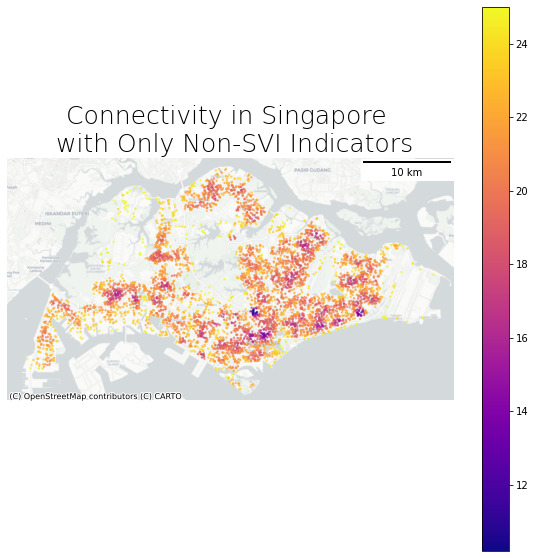

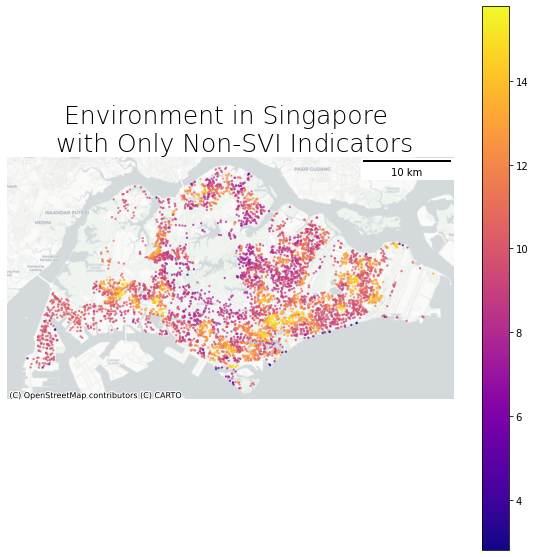

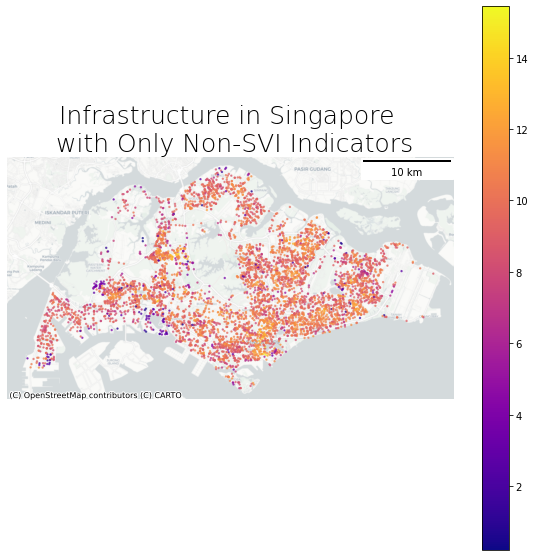

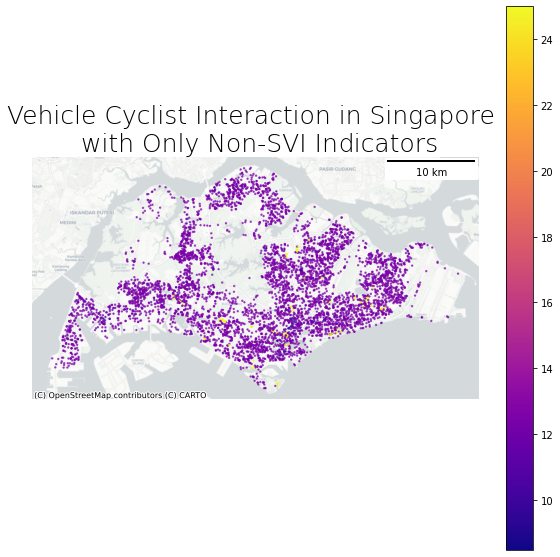

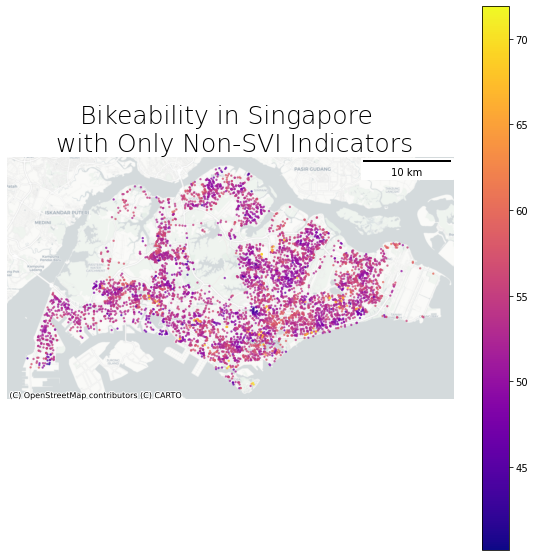

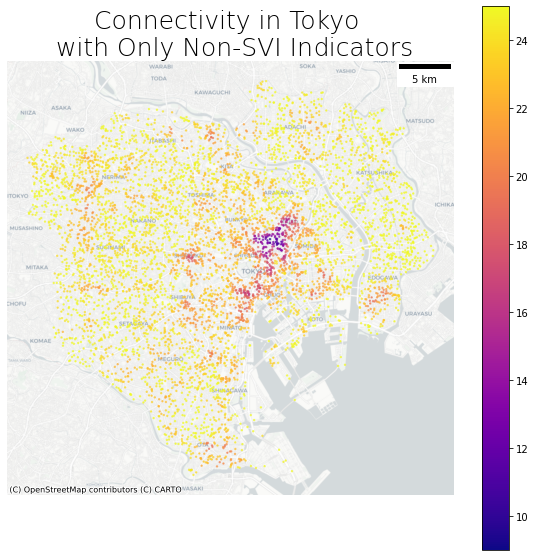

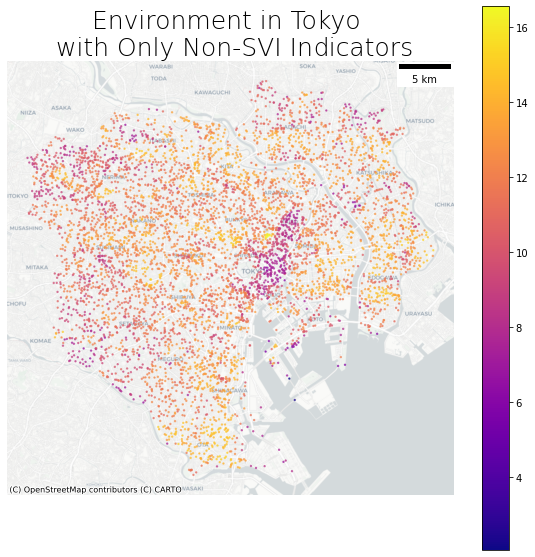

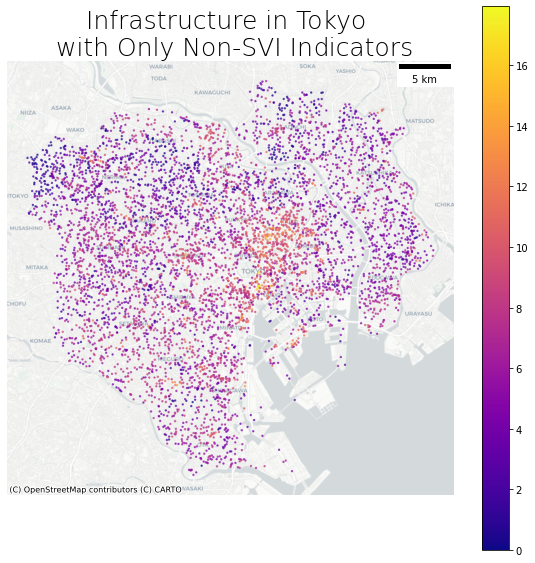

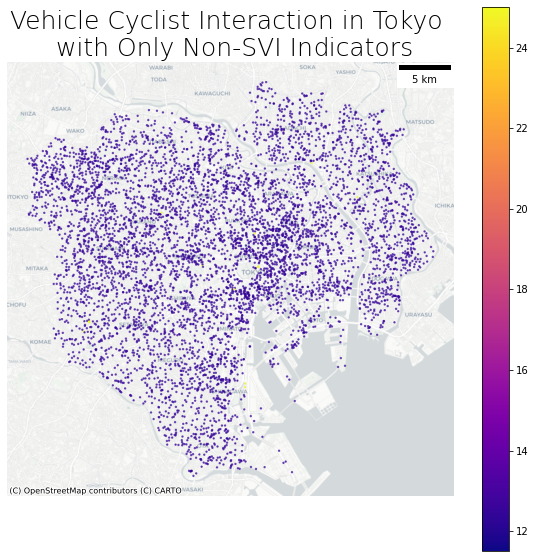

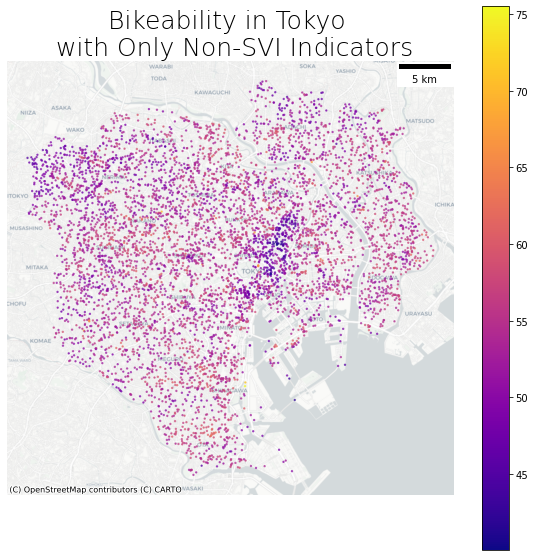

In [10]:
category_list=['connectivity',
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'bikeability'
              ]

city_list=['Singapore',
           'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"

for city in city_list:
    for category in category_list:
        category_df=pd.read_csv(os.path.join(root,'data/tabular_data/{}/only_non_svi_{}.csv'.format(city,category)))
        category_df['geometry']=category_df.apply(lambda x: Point((float(x.panoLon), float(x.panoLat))), axis=1)
        category_gdf=gpd.GeoDataFrame(category_df, geometry='geometry')
        category_gdf=category_gdf.set_crs(epsg=4326)
        category_gdf=category_gdf.to_crs("EPSG:3857")
        
        # visualize
        fig, ax = plt.subplots(1, figsize=(10,10))
        category_gdf.plot(column=category,ax=ax,
                          cmap='plasma',
                          alpha=0.6,
                          markersize=2,
                          legend=True
                         )
        ax.set_axis_off()
        # add title
        title="{} in {} \n with Only Non-SVI Indicators".format(category.replace('_',' ').title(),city)
        ax.set_title(title, fontdict={"fontsize": "25", "fontweight" : "3"})
        # add scalebar
        scalebar = ScaleBar(dx=1) 
        plt.gca().add_artist(scalebar)
        # add data source
#         if category=='connectivity':
#             data_source='OpenStreetMaps, 2021'
#         elif category=='environment':
#             data_source='Yamazaki et al., 2017, Tokyo Metropolitan Government'
#         ax.text('Data: ',
#                 verticalalignment='bottom', horizontalalignment='right',
#                 transform=ax.transAxes, color='green', fontsize=15)
        
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs=category_gdf.crs.to_string())
        fig.savefig(os.path.join(root,'output/maps/only_non_svi_{}_{}.jpg'.format(city,category)),
                    bbox_inches='tight',
                    dpi=400)

### SVI only

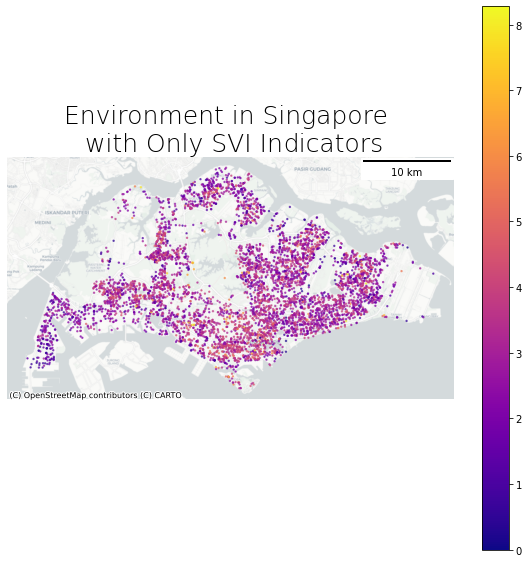

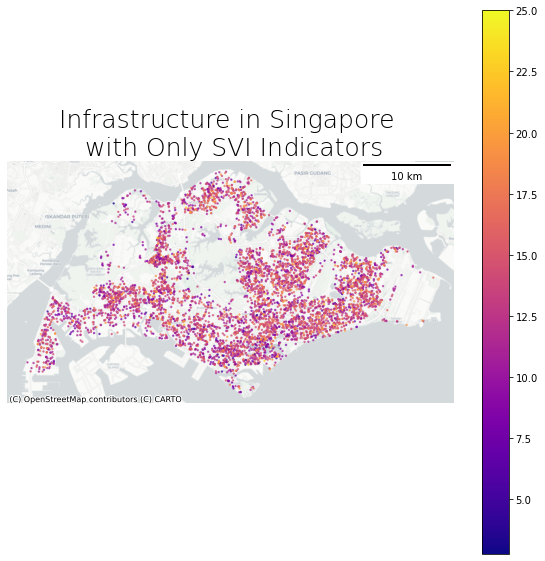

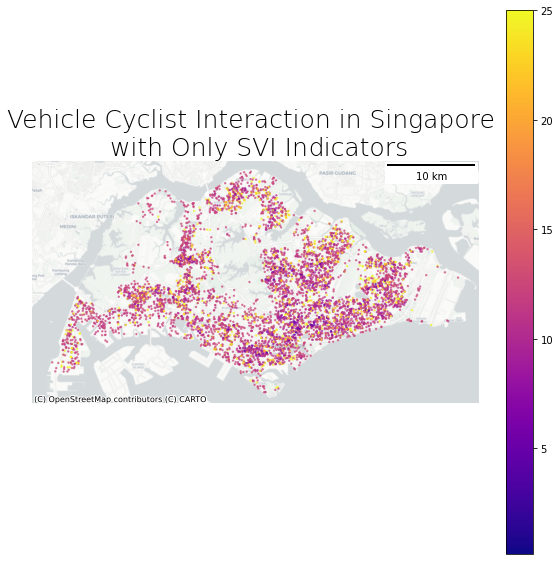

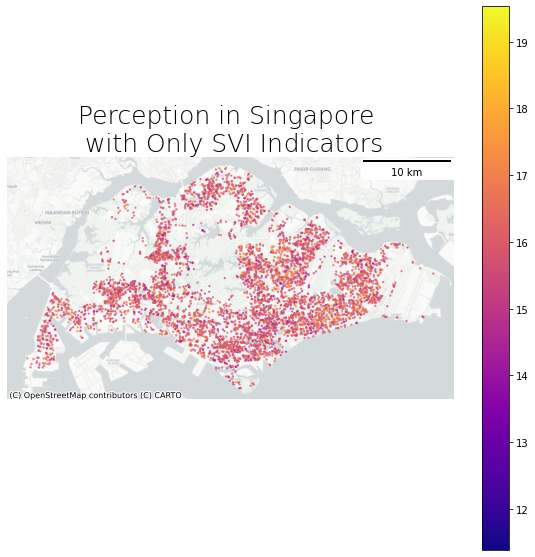

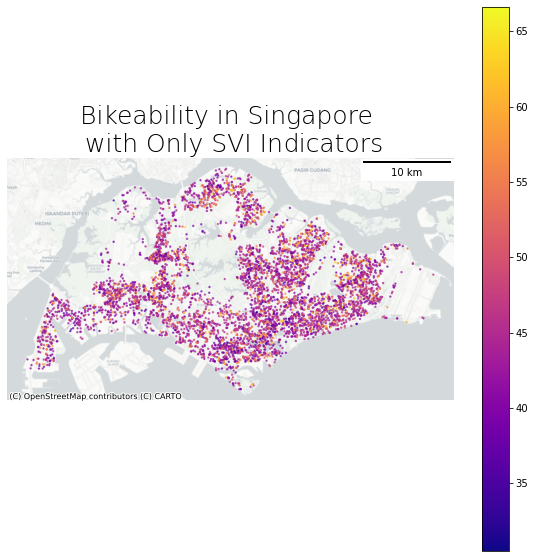

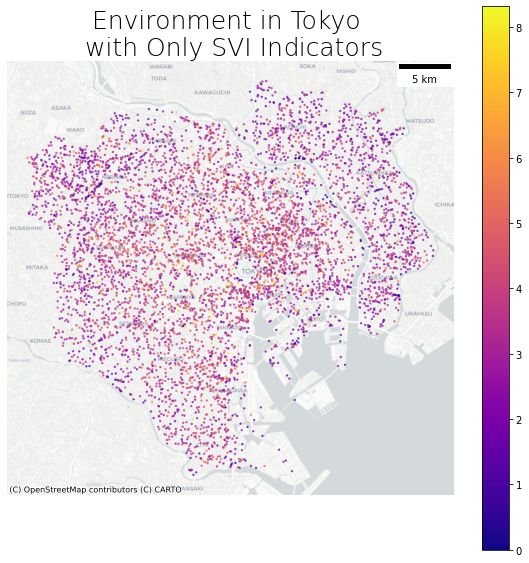

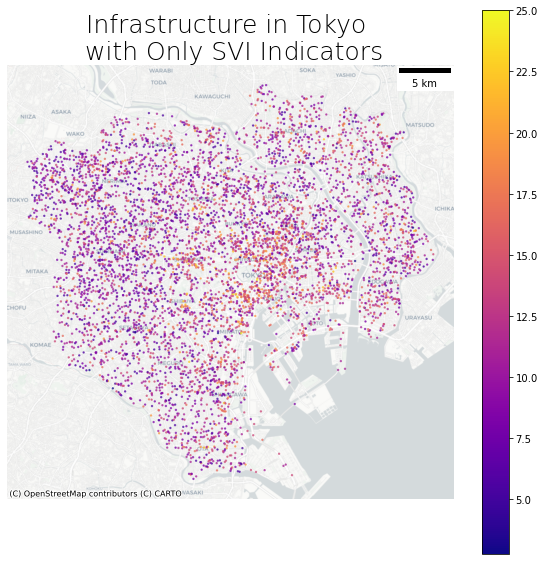

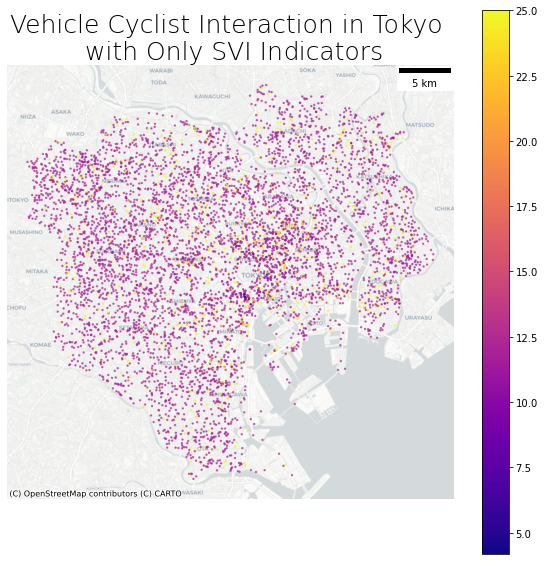

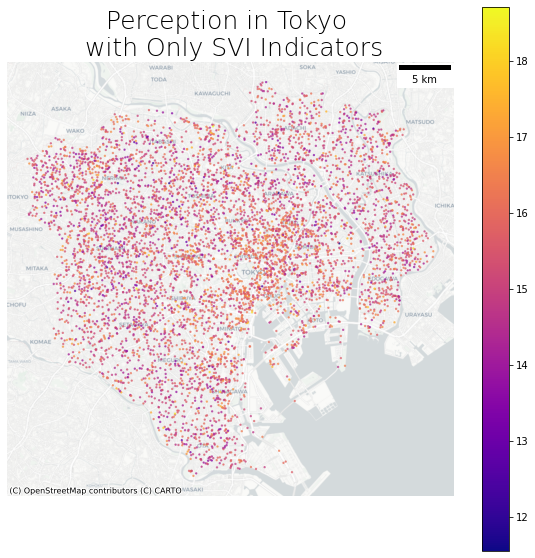

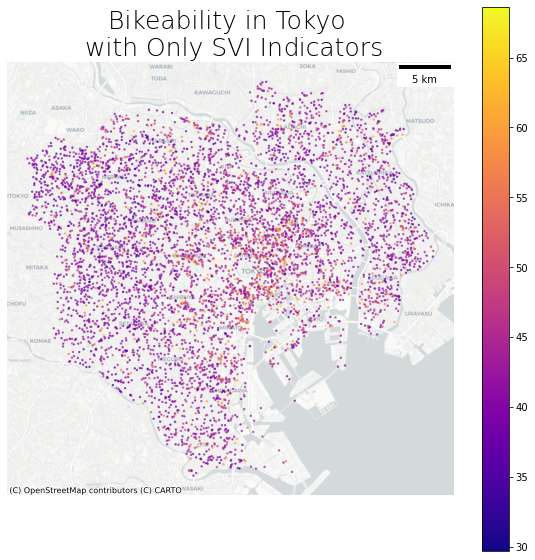

In [11]:
category_list=[
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'perception',
               'bikeability'
              ]

city_list=['Singapore',
           'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"

for city in city_list:
    for category in category_list:
        category_df=pd.read_csv(os.path.join(root,'data/tabular_data/{}/only_svi_{}.csv'.format(city,category)))
        category_df['geometry']=category_df.apply(lambda x: Point((float(x.panoLon), float(x.panoLat))), axis=1)
        category_gdf=gpd.GeoDataFrame(category_df, geometry='geometry')
        category_gdf=category_gdf.set_crs(epsg=4326)
        category_gdf=category_gdf.to_crs("EPSG:3857")
        
        # visualize
        fig, ax = plt.subplots(1, figsize=(10,10))
        category_gdf.plot(column=category,ax=ax,
                          cmap='plasma',
                          alpha=0.6,
                          markersize=2,
                          legend=True
                         )
        ax.set_axis_off()
        # add title
        title="{} in {} \n with Only SVI Indicators".format(category.replace('_',' ').title(),city)
        ax.set_title(title, fontdict={"fontsize": "25", "fontweight" : "3"})
        # add scalebar
        scalebar = ScaleBar(dx=1) 
        plt.gca().add_artist(scalebar)
        # add data source
#         if category=='connectivity':
#             data_source='OpenStreetMaps, 2021'
#         elif category=='environment':
#             data_source='Yamazaki et al., 2017, Tokyo Metropolitan Government'
#         ax.text('Data: ',
#                 verticalalignment='bottom', horizontalalignment='right',
#                 transform=ax.transAxes, color='green', fontsize=15)
        
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs=category_gdf.crs.to_string())
        fig.savefig(os.path.join(root,'output/maps/only_svi_{}_{}.jpg'.format(city,category)),
                    bbox_inches='tight',
                    dpi=400)

## Street Map

### prepare data

In [ ]:
category_list=[
               'connectivity',
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'perception',
               'bikeability'
              ]

city_list=[
    'Singapore',
    'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"

for city in city_list:
    # category data
    category_df=pd.read_csv(os.path.join(root,'data/tabular_data/{}/bikeability.csv'.format(city)))
    category_df['geometry']=category_df.apply(lambda x: Point((float(x.panoLon), float(x.panoLat))), axis=1)
    category_gdf=gpd.GeoDataFrame(category_df, geometry='geometry')
    category_gdf=category_gdf.set_crs(epsg=4326)
    category_gdf=category_gdf.to_crs("EPSG:3857")

    # load street network
    network=os.path.join(root,'data/network/{}_street_network/edges.shp'.format(city))
    network_gdf=gpd.read_file(network)
    #convert to Pseudo-Mercator
    network_gdf=network_gdf.to_crs("EPSG:3857")
    # create 1000m buffer around img_location_gdf
    buffer_1000m = network_gdf.copy()
    buffer_1000m["geometry"]=network_gdf.geometry.buffer(1000)
    # intersect with category_gdf
    category_in_1000m = gpd.sjoin(buffer_1000m, category_gdf, how="left", op='intersects')
    # group by v
    category_in_1000m_grouped=category_in_1000m.groupby(['v']).\
                              agg({'connectivity':'mean',
                                   'environment':'mean',
                                   'infrastructure':'mean',
                                   'vehicle_cyclist_interaction':'mean',
                                   'perception':'mean',
                                   'bikeability':'mean'
                                  }).\
                              reset_index()

    # left join on v
    network_joined=pd.merge(network_gdf[['v','geometry']],category_in_1000m_grouped,
                           on='v',how='left')
    # save the dataframe
    print(network_joined)
    network_joined.to_file(os.path.join(root,'data/network/{}_street_network/bikeability.shp'.format(city)))

### visualize

In [ ]:
category_list=[
               'connectivity',
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'perception',
               'bikeability'
              ]

city_list=[
    'Singapore',
    'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"
for city in city_list:
    network=os.path.join(root,'data/network/{}_street_network/bikeability.shp'.format(city))
    network_gdf=gpd.read_file(network)
    for category in category_list:
        category_gdf=network_gdf[['geometry',category[:10]]]
        category_gdf=category_gdf.rename(columns={category[:10]:category})
        category_gdf=category_gdf.dropna(subset=[category])
        # visualize
        fig, ax = plt.subplots(1, figsize=(10,10))
        category_gdf.plot(column=category,ax=ax,
                          cmap='plasma',
                          alpha=1,
                          linewidth=0.2,
                          legend=True
                         )
        ax.set_axis_off()
        # add title
        title="{} in {}".format(category.replace('_',' ').title(),city)
        ax.set_title(title, fontdict={"fontsize": "25", "fontweight" : "3"})
        # add scalebar
        scalebar = ScaleBar(dx=1) 
        plt.gca().add_artist(scalebar)
        # add data source
#         if category=='connectivity':
#             data_source='OpenStreetMaps, 2021'
#         elif category=='environment':
#             data_source='Yamazaki et al., 2017, Tokyo Metropolitan Government'
#         ax.text('Data: ',
#                 verticalalignment='bottom', horizontalalignment='right',
#                 transform=ax.transAxes, color='green', fontsize=15)
        
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs=category_gdf.crs.to_string())
        fig.savefig(os.path.join(root,'output/maps/street_network_{}_{}.jpg'.format(city,category)),
                    bbox_inches='tight',
                    dpi=400)

## Summary Statistics

### SVI&non-SVI

In [12]:
category_list=['connectivity',
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'perception',
               'bikeability'
              ]

city_list=['Singapore',
           'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"
result_list=[]
for city in city_list:
    for category in category_list:
        # category data
        category_df=pd.read_csv(os.path.join(root,'data/tabular_data/{}/{}.csv'.format(city,category)))
        mean=category_df[category].mean()
        std=category_df[category].std()
        dict_temp={}
        dict_temp['city']=city
        dict_temp['category']=category
        dict_temp['mean']=mean
        dict_temp['std']=std
        result_list.append(dict_temp)
result_df=pd.DataFrame(result_list)
print(result_df)
result_df.to_csv(os.path.join(root,'data/tabular_data/summary_statistics.csv'))

         city                     category       mean       std
0   Singapore                 connectivity  16.631126  1.586850
1   Singapore                  environment   5.823404  0.935379
2   Singapore               infrastructure   9.880401  1.904744
3   Singapore  vehicle_cyclist_interaction  10.495766  2.116221
4   Singapore                   perception  12.763042  0.615064
5   Singapore                  bikeability  55.593738  3.385906
6       Tokyo                 connectivity  18.718586  1.698796
7       Tokyo                  environment   6.575161  0.943281
8       Tokyo               infrastructure   7.859966  2.361042
9       Tokyo  vehicle_cyclist_interaction  10.422648  1.607225
10      Tokyo                   perception  12.363627  0.679225
11      Tokyo                  bikeability  55.939987  3.297838


### non-SVI only

In [13]:
category_list=['connectivity',
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'bikeability'
              ]

city_list=['Singapore',
           'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"
result_list=[]
for city in city_list:
    for category in category_list:
        # category data
        category_df=pd.read_csv(os.path.join(root,'data/tabular_data/{}/only_non_svi_{}.csv'.format(city,category)))
        mean=category_df[category].mean()
        std=category_df[category].std()
        dict_temp={}
        dict_temp['city']=city
        dict_temp['category']=category
        dict_temp['mean']=mean
        dict_temp['std']=std
        result_list.append(dict_temp)
result_df=pd.DataFrame(result_list)
print(result_df)
result_df.to_csv(os.path.join(root,'data/tabular_data/only_non_svi_summary_statistics.csv'))

        city                     category       mean       std
0  Singapore                 connectivity  20.788907  1.983562
1  Singapore                  environment  10.520110  1.862503
2  Singapore               infrastructure   9.585596  1.785770
3  Singapore  vehicle_cyclist_interaction  12.640524  1.650958
4  Singapore                  bikeability  53.535138  3.078362
5      Tokyo                 connectivity  23.398232  2.123495
6      Tokyo                  environment  11.794879  1.783290
7      Tokyo               infrastructure   6.076679  2.706364
8      Tokyo  vehicle_cyclist_interaction  12.528835  0.615934
9      Tokyo                  bikeability  53.798625  3.246971


### SVI only

In [14]:
category_list=[
               'environment',
               'infrastructure',
               'vehicle_cyclist_interaction',
               'perception',
               'bikeability'
              ]

city_list=['Singapore',
           'Tokyo'
          ]
root = "/home/ec2-user/SageMaker/"
result_list=[]
for city in city_list:
    for category in category_list:
        # category data
        category_df=pd.read_csv(os.path.join(root,'data/tabular_data/{}/only_svi_{}.csv'.format(city,category)))
        mean=category_df[category].mean()
        std=category_df[category].std()
        dict_temp={}
        dict_temp['city']=city
        dict_temp['category']=category
        dict_temp['mean']=mean
        dict_temp['std']=std
        result_list.append(dict_temp)
result_df=pd.DataFrame(result_list)
print(result_df)
result_df.to_csv(os.path.join(root,'data/tabular_data/only_svi_summary_statistics.csv'))

        city                     category       mean       std
0  Singapore                  environment   2.958116  1.059625
1  Singapore               infrastructure  13.579347  3.229201
2  Singapore  vehicle_cyclist_interaction  13.598890  5.052510
3  Singapore                   perception  15.953802  0.768830
4  Singapore                  bikeability  46.090156  6.541738
5      Tokyo                  environment   3.451049  1.253694
6      Tokyo               infrastructure  11.490859  3.854817
7      Tokyo  vehicle_cyclist_interaction  13.527784  3.977728
8      Tokyo                   perception  15.454533  0.849032
9      Tokyo                  bikeability  43.924225  6.149825


# Show 2 examples of images for each score and range
- score<4.5
- 4.5<score<6.25
- 6.25<score<8
- 8<score

In [ ]:
root = "/home/ec2-user/SageMaker/"
seed=12
n_sample=2
target_variables=['beauty',
                  'building_attractiveness','cleanliness','cycling_attractiveness',
                  'living_attractiveness','safety','spaciousness'
                 ]
# survey result
result=pd.read_csv(os.path.join(root,'data/survey_result/survey_1st_2nd_combined_without_outliers_grouped.csv'))
result['img_pano_id']=result['pano_id']+'.jpg'
# list of images used for survey
img_list=glob.glob(os.path.join(root,'data/img_survey_resampled_800/*/*.jpg'))
# go through each variable
for target_variable in tqdm.tqdm(target_variables):
    target_variable_df=result[['img_pano_id',target_variable]]
    # score<4.5
    target_variable_df_less_than_45=target_variable_df.loc[target_variable_df[target_variable]<4.5]
    target_variable_df_less_than_45_sampled=target_variable_df_less_than_45.sample(n=n_sample,random_state=seed)
    target_variable_df_less_than_45_sampled_list=target_variable_df_less_than_45_sampled['img_pano_id'].tolist()
    less_than_45_img_list=[img for img in img_list if img.endswith(tuple(target_variable_df_less_than_45_sampled_list))]
    
    # 4.5<score<6.25
    target_variable_df_between_45_625=target_variable_df.loc[(target_variable_df[target_variable]>=4.5)&
                                                           (target_variable_df[target_variable]<6.25)
                                                          ]
    target_variable_df_between_45_625_sampled=target_variable_df_between_45_625.sample(n=n_sample,random_state=seed) 
    target_variable_df_between_45_625_sampled_list=target_variable_df_between_45_625_sampled['img_pano_id'].tolist()
    between_45_625_img_list=[img for img in img_list if img.endswith(tuple(target_variable_df_between_45_625_sampled_list))]
    
    # 6.25<score<8
    target_variable_df_between_625_8=target_variable_df.loc[(target_variable_df[target_variable]>=6.25)&
                                                           (target_variable_df[target_variable]<8)
                                                          ]
    target_variable_df_between_625_8_sampled=target_variable_df_between_625_8.sample(n=n_sample,random_state=seed)  
    target_variable_df_between_625_8_sampled_list=target_variable_df_between_625_8_sampled['img_pano_id'].tolist()
    between_625_8_img_list=[img for img in img_list if img.endswith(tuple(target_variable_df_between_625_8_sampled_list))]

    # 8<score
    target_variable_df_greater_than_8=target_variable_df.loc[target_variable_df[target_variable]>=8]
    target_variable_df_greater_than_8_sampled=target_variable_df_greater_than_8.sample(n=n_sample,random_state=seed)
    target_variable_df_greater_than_8_sampled_list=target_variable_df_greater_than_8_sampled['img_pano_id'].tolist()
    greater_than_8_img_list=[img for img in img_list if img.endswith(tuple(target_variable_df_greater_than_8_sampled_list))]

    # copy file to new folders
    for i in range(n_sample):
        # score<4.5
        output_folder_less_than_45=os.path.join(root,'data/survey_result/{}/less_than_45/'.format(target_variable))
        if not os.path.exists(output_folder_less_than_45):
            os.makedirs(output_folder_less_than_45)
        less_than_45_img=less_than_45_img_list[i]
        shutil.copy2(less_than_45_img,output_folder_less_than_45)
        
        # 4.5<score<6.25
        output_folder_between_45_625=os.path.join(root,'data/survey_result/{}/between_45_625/'.format(target_variable))
        if not os.path.exists(output_folder_between_45_625):
            os.makedirs(output_folder_between_45_625)
        between_45_625_img=between_45_625_img_list[i]
        shutil.copy2(between_45_625_img,output_folder_between_45_625)
        
        # 6.25<score<8
        output_folder_between_625_8=os.path.join(root,'data/survey_result/{}/between_between_625_8/'.format(target_variable))
        if not os.path.exists(output_folder_between_625_8):
            os.makedirs(output_folder_between_625_8)
        between_625_8_img=between_625_8_img_list[i]
        shutil.copy2(between_625_8_img,output_folder_between_625_8)
        
        # 8<score
        output_folder_greater_than_8=os.path.join(root,'data/survey_result/{}/greater_than_8/'.format(target_variable))
        if not os.path.exists(output_folder_greater_than_8):
            os.makedirs(output_folder_greater_than_8)
        greater_than_8_img=greater_than_8_img_list[i]
        shutil.copy2(greater_than_8_img,output_folder_greater_than_8)

## display images

In [ ]:
target_variables=['beauty',
                  'building_attractiveness','cleanliness','cycling_attractiveness',
                  'living_attractiveness','safety','spaciousness'
                 ]
score_range_list=['less_than_45','between_45_625','between_between_625_8','greater_than_8']

for target_variable in target_variables:
    print('**********************{}**********************'.format(target_variable))
    for score_range in score_range_list:
        print('**********************{}**********************'.format(score_range))
        img_list=glob.glob(os.path.join(root,'data/survey_result/{}/{}/*.jpg'.format(target_variable,score_range)))
        for img in img_list:
            display(Image(img))

# T-test on survey

In [9]:
root = "/home/ec2-user/SageMaker/"
target_variables=['beauty',
                  'building_attractiveness','cleanliness','cycling_attractiveness',
                  'living_attractiveness','safety','spaciousness'
                 ]
data_list=[
           'segmentation',
           'detection',
           'classification',
           'edge_detection',
           'blob_detection',
           'hls_statistics'
          ]

# store result in a list
result_list=[]

# survey result
result=pd.read_csv(os.path.join(root,'data/survey_result/survey_1st_2nd_combined_without_outliers_grouped.csv'))

# go through each data
for data in tqdm.tqdm(data_list):
    # load data and combine with 
    data_df=pd.read_csv(os.path.join(root,'data/tabular_data/survey_2nd/{}.csv'.format(data)))
    data_df.drop(data_df.filter(regex='Unnamed').columns, axis=1, inplace=True)
    data_df.columns=['pano_id' if col =='pano_id' else data+'_'+col for col in data_df.columns]
    result_data=pd.merge(result,data_df,on='pano_id',how='left')
    result_data.drop(result.filter(regex='Unnamed').columns, axis=1, inplace=True)
    
    # create columns for above mean
    data_col=[col for col in result_data.columns if col.startswith(data)]
    for col in data_col:
        result_data[col+'_mean']=result_data[col].mean()
        result_data[col]=np.where(result_data[col]>result_data[col+'_mean'],1,0)
        result_data.drop([col+'_mean'],axis=1,inplace=True)
    
        # go through target variables
        for target_variable in target_variables:
            cat1 = result_data[result_data[col]==1]
            cat2 = result_data[result_data[col]==0]
            t_value,p_value=ttest_ind(cat1[target_variable], cat2[target_variable],equal_var=False)
            # store the result and append it to result_list
            result_dict={'perception_score':target_variable,
                         'data':col,
                         't_value':t_value,
                         'p_value':p_value
                        }
            result_list.append(result_dict)
# convert result_list to dataframe and save it as csv
result_df=pd.DataFrame(result_list)
print(result_df)
result_df.to_csv(os.path.join(root,'data/survey_result/perception_t_test.csv'))

 17%|█▋        | 1/6 [00:01<00:05,  1.09s/it]/home/ec2-user/anaconda3/envs/mxnet_latest_p37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3584: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/home/ec2-user/anaconda3/envs/mxnet_latest_p37/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/ec2-user/anaconda3/envs/mxnet_latest_p37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3584: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/home/ec2-user/anaconda3/envs/mxnet_latest_p37/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/ec2-user/anaconda3/envs/mxnet_latest_p37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3584: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/home/ec2-user/anaconda3/envs/mxnet_latest_p37/l

             perception_score                       data   t_value   p_value
0                      beauty  segmentation_animal--bird -0.014364  0.989084
1     building_attractiveness  segmentation_animal--bird -0.419255  0.692292
2                 cleanliness  segmentation_animal--bird -0.424310  0.688817
3      cycling_attractiveness  segmentation_animal--bird -0.047680  0.963795
4       living_attractiveness  segmentation_animal--bird -0.089861  0.931841
...                       ...                        ...       ...       ...
3628              cleanliness       hls_statistics_s_std -2.812970  0.005036
3629   cycling_attractiveness       hls_statistics_s_std -3.066971  0.002237
3630    living_attractiveness       hls_statistics_s_std -1.590844  0.112060
3631                   safety       hls_statistics_s_std -2.291851  0.022187
3632             spaciousness       hls_statistics_s_std -3.964800  0.000080

[3633 rows x 4 columns]


In [15]:
# check the result of t-test
root = "/home/ec2-user/SageMaker/"
t_test_result=pd.read_csv(os.path.join(root,'data/survey_result/perception_t_test.csv'))
t_test_result.loc[t_test_result['p_value']<0.01].sample(100).head(30)

,Unnamed: 0,perception_score,data,t_value,p_value
1128,1128,building_attractiveness,classification_arena/hockey,-3.642777,0.000325
1725,1725,cycling_attractiveness,classification_computer_room,-3.106920,0.002128
203,203,beauty,segmentation_nature--terrain,3.636642,0.000303
3156,3156,spaciousness,classification_ski_resort,-2.832025,0.005463
3095,3095,building_attractiveness,classification_schoolhouse,-2.764013,0.006003
1747,1747,living_attractiveness,classification_construction_site,-3.161678,0.001755
1769,1769,safety,classification_corridor,-2.901586,0.004418
334,334,safety,segmentation_object--support--utility-pole,-2.919566,0.003662
1286,1286,safety,classification_bank_vault,-4.237695,0.000053
3553,3553,living_attractiveness,classification_windmill,-2.896075,0.004178


# Create box plot matrix of perception scores and features
- segmentation: mean 
- detection: 0 or above 0
- classification: mean
- edge detection: mean
- blob detection: mean
- hls statistics: mean

In [ ]:
root = "/home/ec2-user/SageMaker/"
target_variables=['beauty',
                  'building_attractiveness','cleanliness','cycling_attractiveness',
                  'living_attractiveness','safety','spaciousness'
                 ]
data_list=[
           'segmentation',
           'detection',
           'classification',
           'edge_detection',
           'blob_detection',
           'hls_statistics'
          ]

# survey result
result=pd.read_csv(os.path.join(root,'data/survey_result/survey_1st_2nd_combined_without_outliers_grouped.csv'))

# set size magnifier
size_magnifier=5
batch_size=15
# set font sizes
SMALL_SIZE = size_magnifier*1
MEDIUM_SIZE = size_magnifier*4
BIGGER_SIZE = size_magnifier*10

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', labelsize=MEDIUM_SIZE)     # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
#     plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
for data in tqdm.tqdm(data_list):
    # load data and combine with 
    data_df=pd.read_csv(os.path.join(root,'data/tabular_data/survey_2nd/{}.csv'.format(data)))
    data_df.drop(data_df.filter(regex='Unnamed').columns, axis=1, inplace=True)
    data_df.columns=['pano_id' if col =='pano_id' else data+'_'+col for col in data_df.columns]
    result_data=pd.merge(result,data_df,on='pano_id',how='left')
    result_data.drop(result.filter(regex='Unnamed').columns, axis=1, inplace=True)
    
    # create columns for above mean
    data_col=[col for col in result_data.columns if col.startswith(data)]
    for col in data_col:
        result_data[col+'_mean']=result_data[col].mean()
        result_data[col]=np.where(result_data[col]>result_data[col+'_mean'],1,0)
        result_data.drop([col+'_mean'],axis=1,inplace=True)
    
    batch_num=(len(data_col)//batch_size)
    if len(data_col)%batch_size!=0:
        batch_num+=1
    for batch in range(batch_num):
        # create a boxplot matrix
        nrow=min(batch_size,len(data_col)-batch_size*batch)
        ncol=len(target_variables)
        fig, axes = plt.subplots(nrow, ncol,figsize=(ncol*size_magnifier,nrow*size_magnifier))
        for r in range(nrow):
            for c in range(ncol):
                data_col_name=data_col[batch*batch_size+r]
                if nrow!=1:
                    ax=axes[r,c]
                else:
                    ax=axes[c]
                sns.boxplot(x=data_col_name, y=target_variables[c], 
                            data=result_data, ax=ax, palette='Pastel1',
                            width=0.3)

        fig.tight_layout()
        fig.suptitle("The matrix of boxplots between {} and perception scores".format(data),
                     fontsize=BIGGER_SIZE)
        fig.subplots_adjust(top=0.8)
        fig.savefig(os.path.join(root,'output/survey_result/boxplot_matrix_{}_{}.jpg'.format(data,batch+1)),
                    bbox_inches='tight',
                    dpi=400)
        plt.show()